## Libraries

In [1]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
from torchvision import datasets, transforms
import torchvision.transforms.functional as TF
from torchvision.models import alexnet, AlexNet_Weights, AlexNet

from default_config import default_config, default_net_config, default_train_config, no_transform_config, default_transform_config, data_dir, train_dir, val_dir, test_dir, image_size
from convolutionalNetwork import ConvolutionalNetwork
from residualNetwork import ResidualNetwork, ResidualBlock
from predict import predict
from plot_scores import plot_scores
from plot_transformations import plot_transformations
from result_handler import result_handler
from train_model import train_model

## Check device

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
torch.__version__

cuda


'2.5.1+cu124'

## Explorative Data Analysis

### Dataset walking

In [3]:
for dirpath, dirnames, filenames in os.walk(data_dir):
    if len(dirnames) == 0: # only innermost directories
        print(f"'{dirpath}' directory contains {len(filenames)} images")

'data\test\cats' directory contains 200 images
'data\test\dogs' directory contains 200 images
'data\train\cats' directory contains 1000 images
'data\train\dogs' directory contains 1000 images
'data\validation\cats' directory contains 300 images
'data\validation\dogs' directory contains 300 images


### Labels

In [4]:
print(datasets.ImageFolder(train_dir, transform=transforms.ToTensor()).class_to_idx)

{'cats': 0, 'dogs': 1}


### Plot 10 random images of both cats and dogs

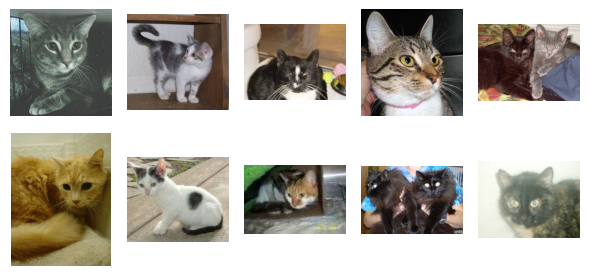

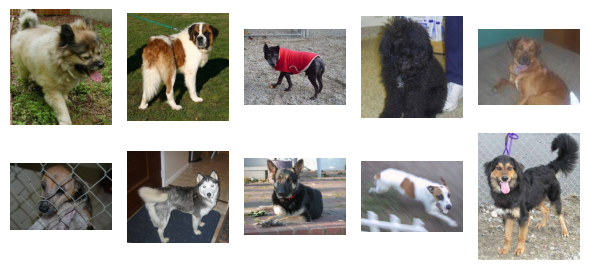

In [5]:
train_cats_dir = f"{train_dir}/cats"
train_dogs_dir = f"{train_dir}/dogs"

cats_images = random.sample([f"{train_cats_dir}/{filename}" for filename in os.listdir(train_cats_dir)], 10)
dogs_images = random.sample([f"{train_dogs_dir}/{filename}" for filename in os.listdir(train_dogs_dir)], 10)

# Plot cat images
fig1, axes1 = plt.subplots(2, 5, figsize=(6, 3))
for i, img in enumerate(cats_images):
    axes1[i // 5, i % 5].imshow(plt.imread(img))
    axes1[i // 5, i % 5].axis("off")
plt.tight_layout()
plt.show()

# Plot dog images
fig2, axes2 = plt.subplots(2, 5, figsize=(6, 3))
for i, img in enumerate(dogs_images):
    axes2[i // 5, i % 5].imshow(plt.imread(img))
    axes2[i // 5, i % 5].axis("off")
plt.tight_layout()
plt.show()

## Transformations

### Use one image as a base

Image size: (400, 376)


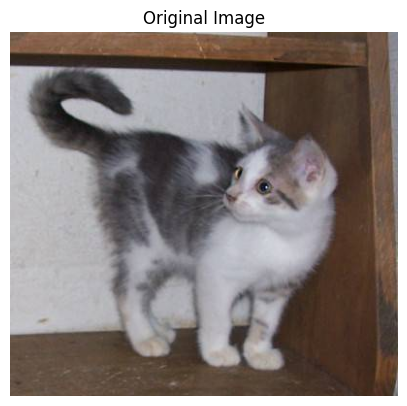

In [6]:
image = Image.open(cats_images[1])

print(f"Image size: {image.size}")

# Plot image_resized
plt.figure(figsize=(5, 5))
plt.imshow(image)
plt.title("Original Image")
plt.axis("off")
plt.show()

### Image size

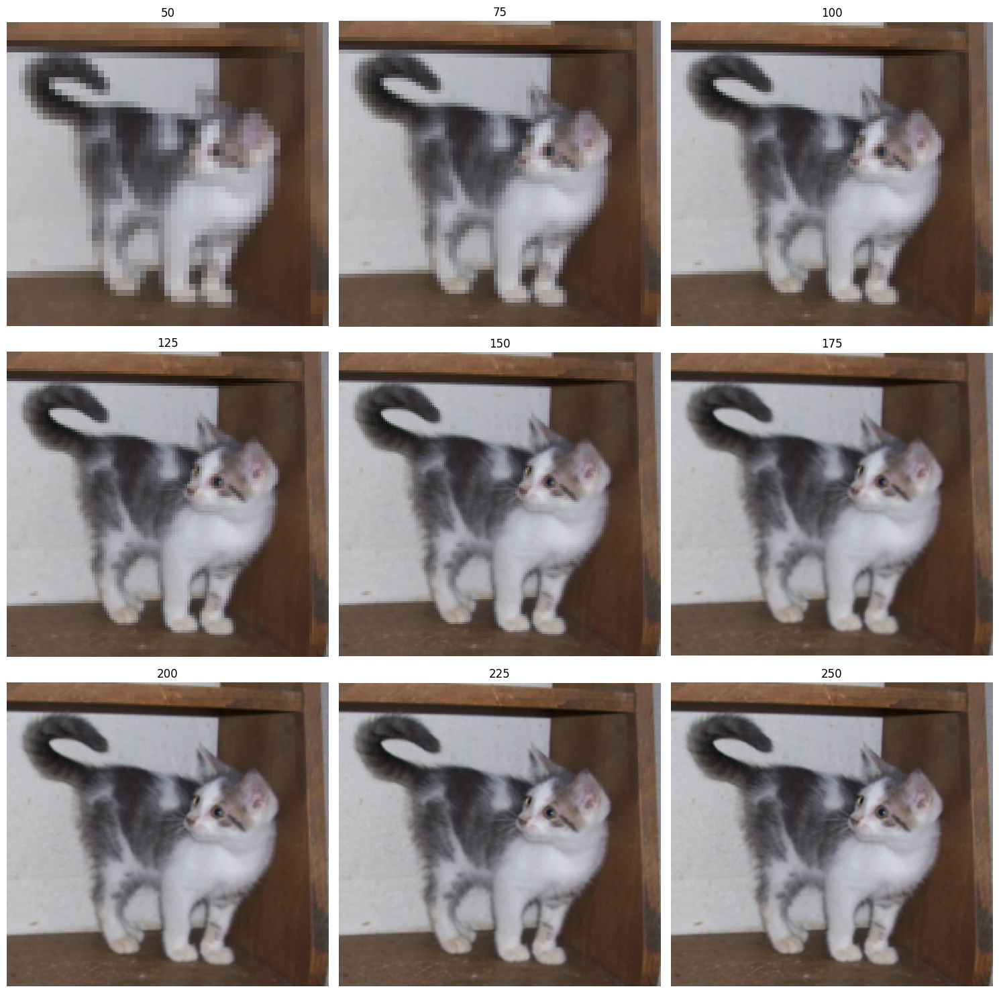

In [7]:
factors = [50, 75, 100, 125, 150, 175, 200, 225, 250]

transformed_images = []
for factor in factors:
    transformed_image = TF.resize(image, factor)
    transformed_images.append(transformed_image)

plot_transformations(transformed_images, factors)

In [8]:
image_resized = TF.resize(image, 200)

### Flip

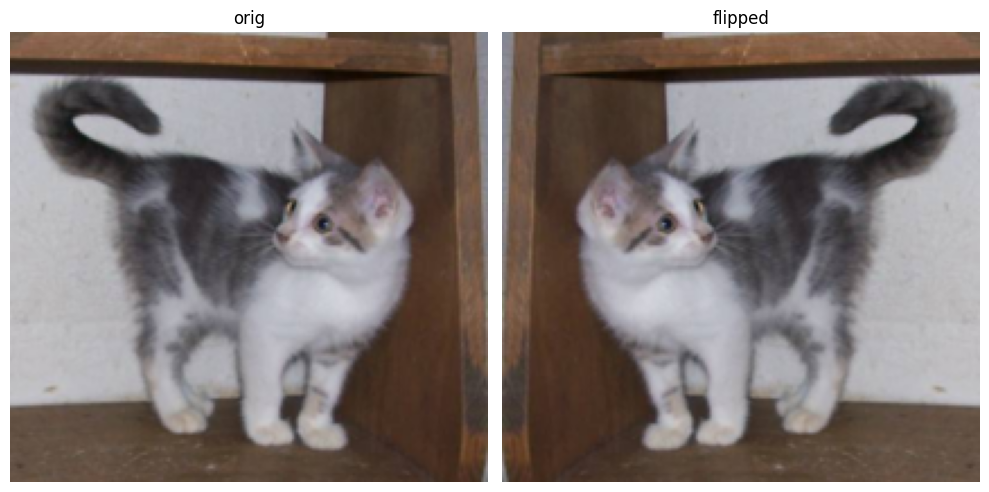

In [9]:
transformed_images = []
transformed_images.append(image_resized)
transformed_images.append(TF.hflip(image_resized))
plot_transformations(transformed_images, ["orig", "flipped"])

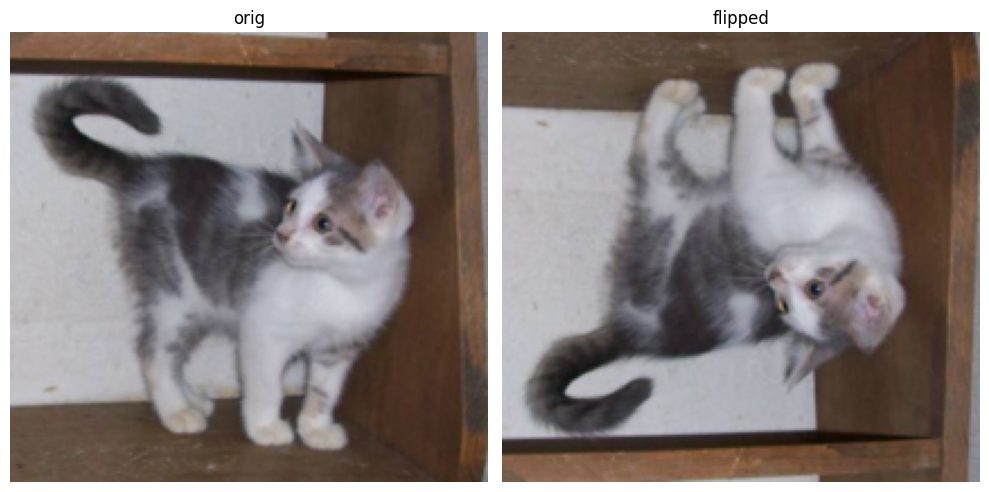

In [10]:
transformed_images = []
transformed_images.append(image_resized)
transformed_images.append(TF.vflip(image_resized))
plot_transformations(transformed_images, ["orig", "flipped"])

### Image rotation

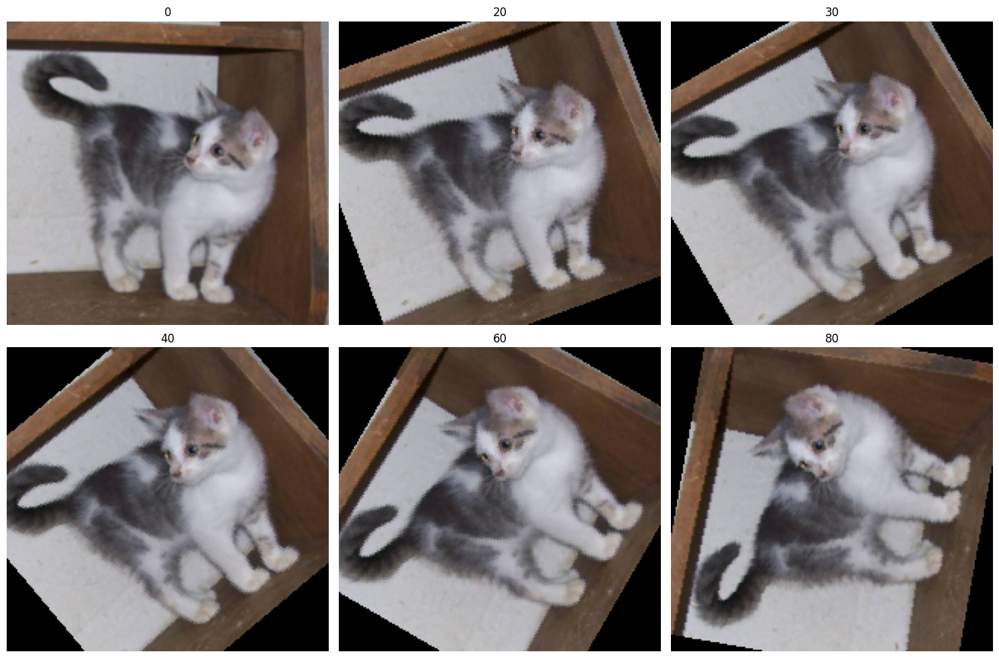

In [11]:
factors = [0, 20, 30, 40, 60, 80]

transformed_images = []
for factor in factors:
    transformed_image = TF.rotate(image_resized, angle=factor)
    transformed_images.append(transformed_image)

plot_transformations(transformed_images, factors)


### Cropping

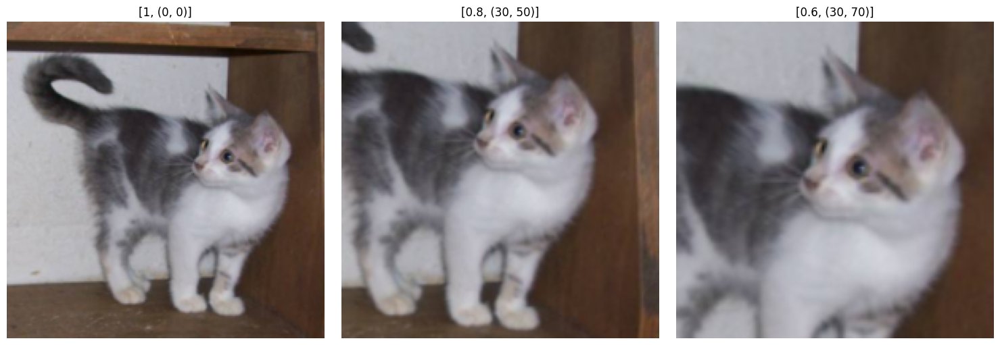

In [12]:
factors = [[1, (0, 0)], [0.8, (30, 50)], [0.6, (30, 70)]]

transformed_images = []
for factor in factors:
    scale = factor[0]
    crop_size = (int(image_size * scale), int(image_size * scale))
    location = factor[1]
    transformed_image = TF.resized_crop(image_resized, location[0], location[1], crop_size[0], crop_size[1], size=(image_size, image_size))
    transformed_images.append(transformed_image)

plot_transformations(transformed_images, factors)

### Image color

#### Brightness

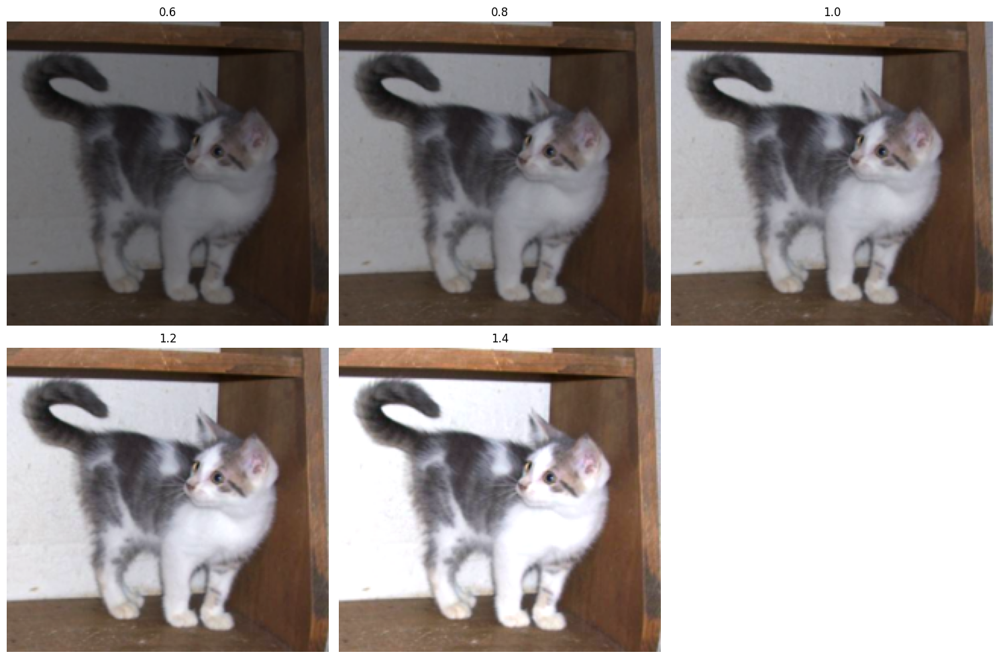

In [13]:
factors = [0.6, 0.8, 1.0, 1.2, 1.4]

transformed_images = []
for factor in factors:
    transformed_image = TF.adjust_brightness(image_resized, factor)
    transformed_images.append(transformed_image)

plot_transformations(transformed_images, factors)

#### Contrast

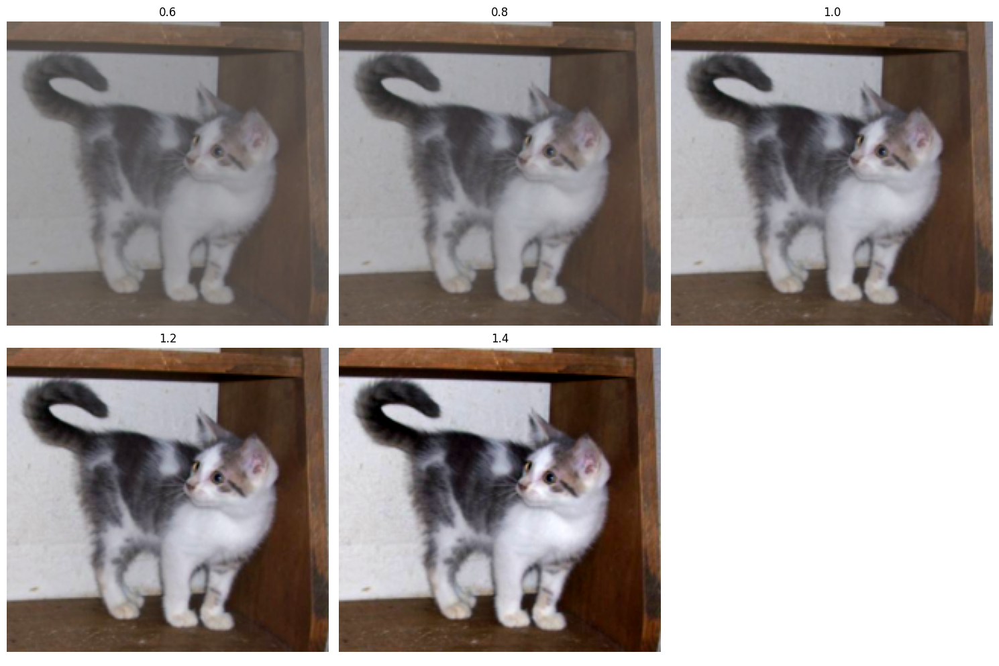

In [14]:
factors = [0.6, 0.8, 1.0, 1.2, 1.4]

transformed_images = []
for factor in factors:
    transformed_image = TF.adjust_contrast(image_resized, factor)
    transformed_images.append(transformed_image)

plot_transformations(transformed_images, factors)

#### Saturation

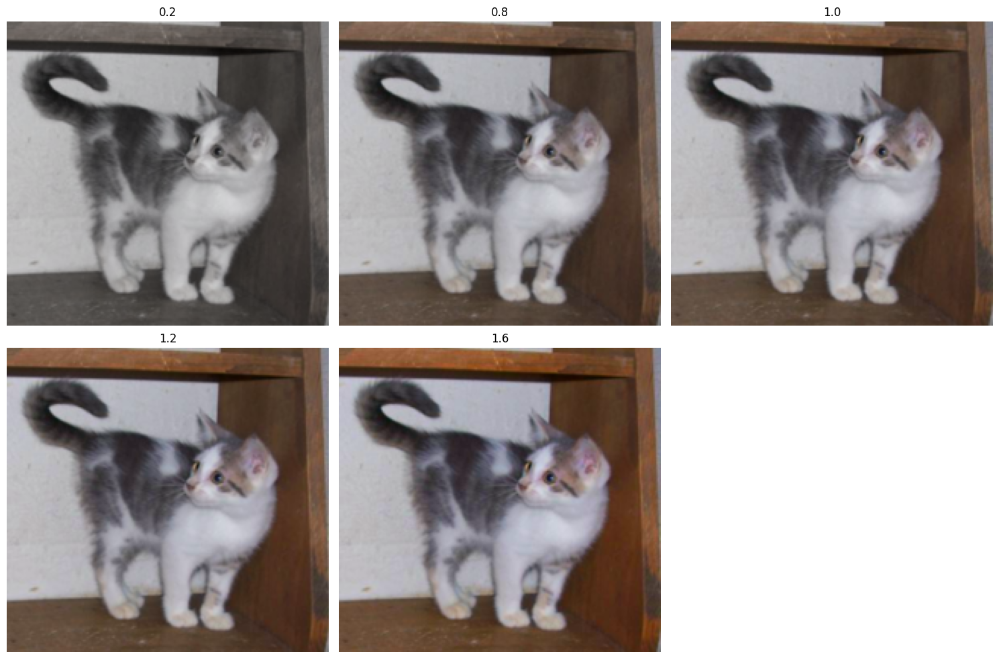

In [15]:
factors = [0.2, 0.8, 1.0, 1.2, 1.6]

transformed_images = []
for factor in factors:
    transformed_image = TF.adjust_saturation(image_resized, factor)
    transformed_images.append(transformed_image)

plot_transformations(transformed_images, factors)

#### Hue

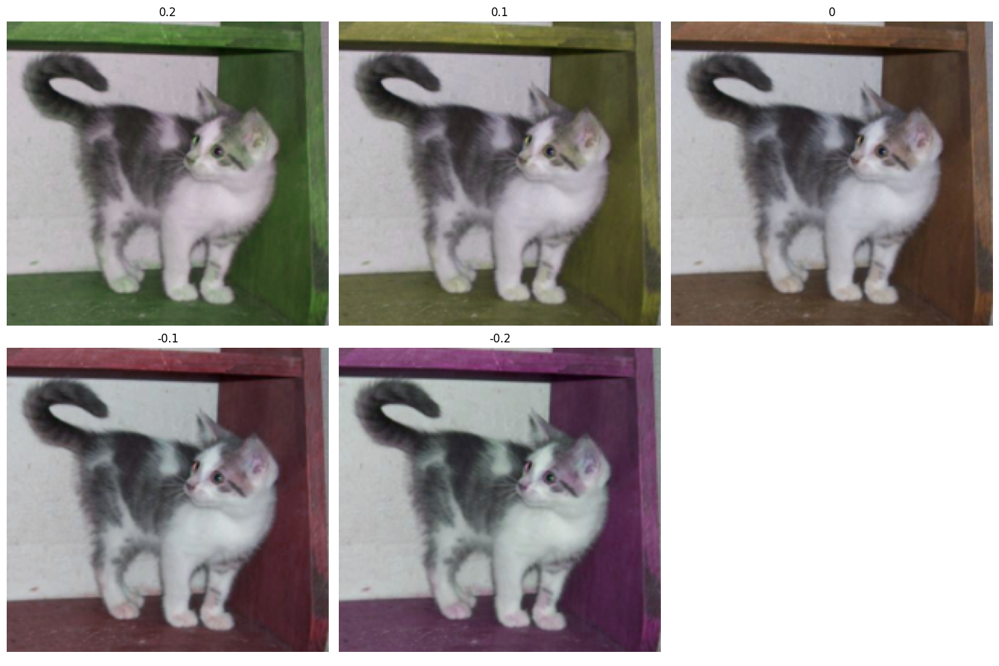

In [16]:
factors = [0.2, 0.1, 0, -0.1, -0.2]

transformed_images = []
for factor in factors:
    transformed_image = TF.adjust_hue(image_resized, factor)
    transformed_images.append(transformed_image)

plot_transformations(transformed_images, factors)

### Gaussian Blur

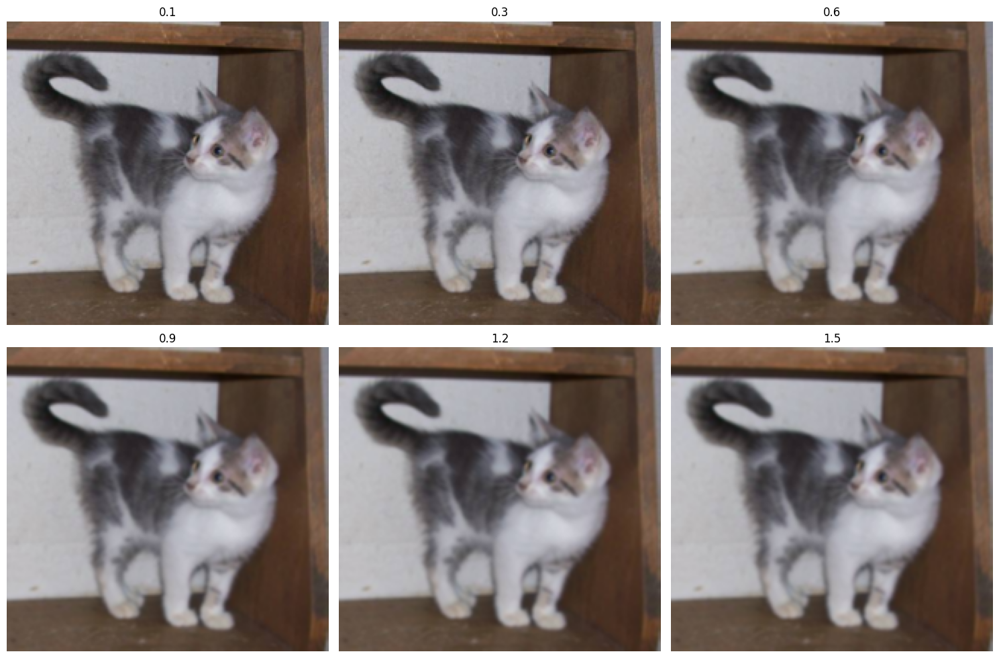

In [17]:
def apply_gaussian_blur(image, kernel_size, sigma):
    return TF.gaussian_blur(image, kernel_size=(kernel_size, kernel_size), sigma=sigma)

factors = [0.1, 0.3, 0.6, 0.9, 1.2, 1.5]

transformed_images = [apply_gaussian_blur(image_resized, kernel_size=3, sigma=sigma) for sigma in factors]

plot_transformations(transformed_images, factors)

### Affine

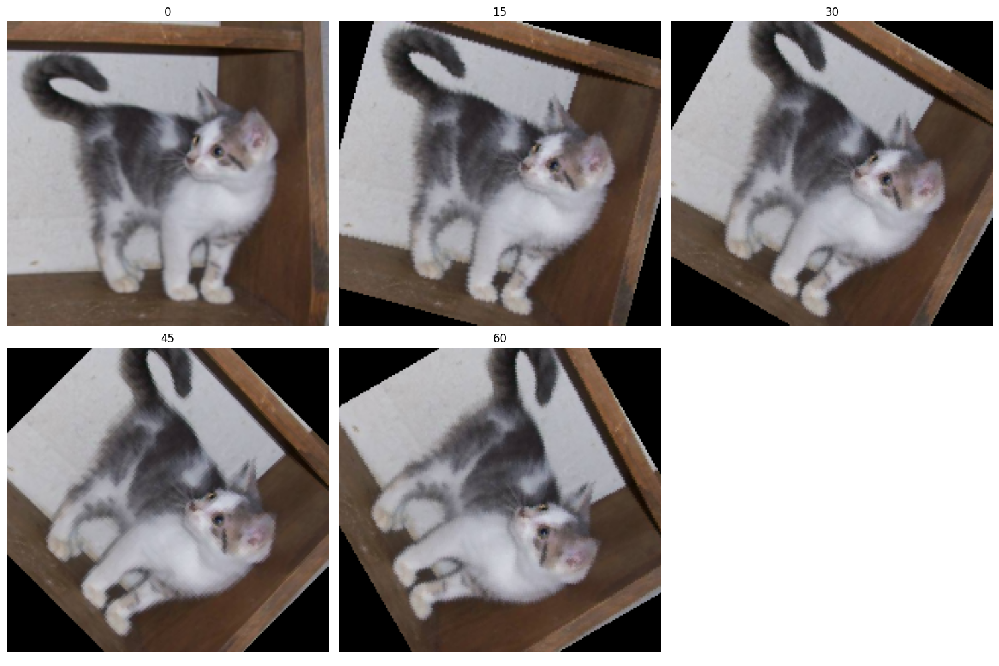

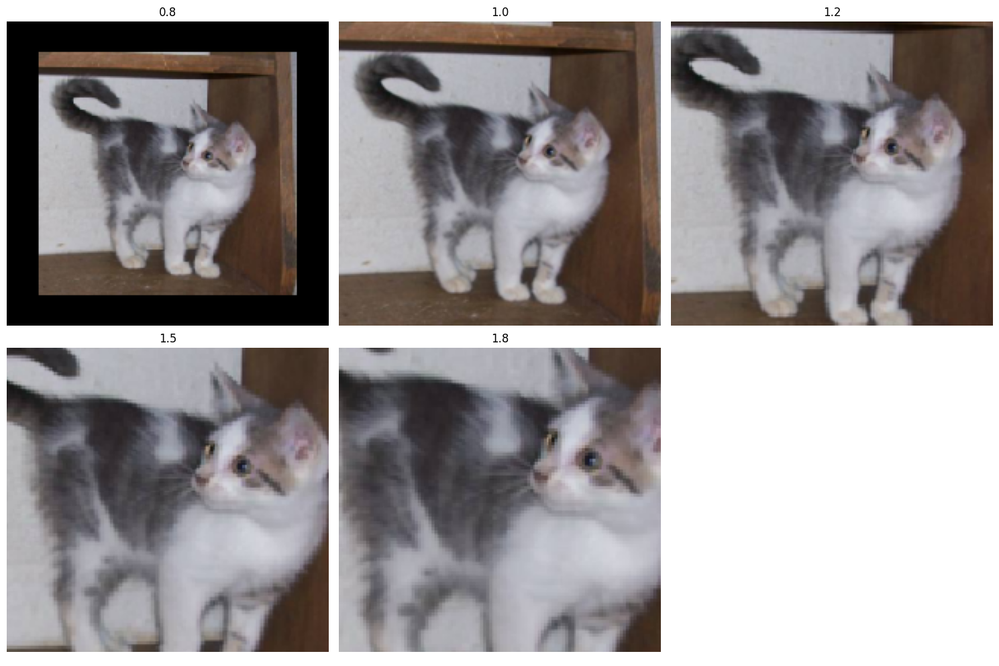

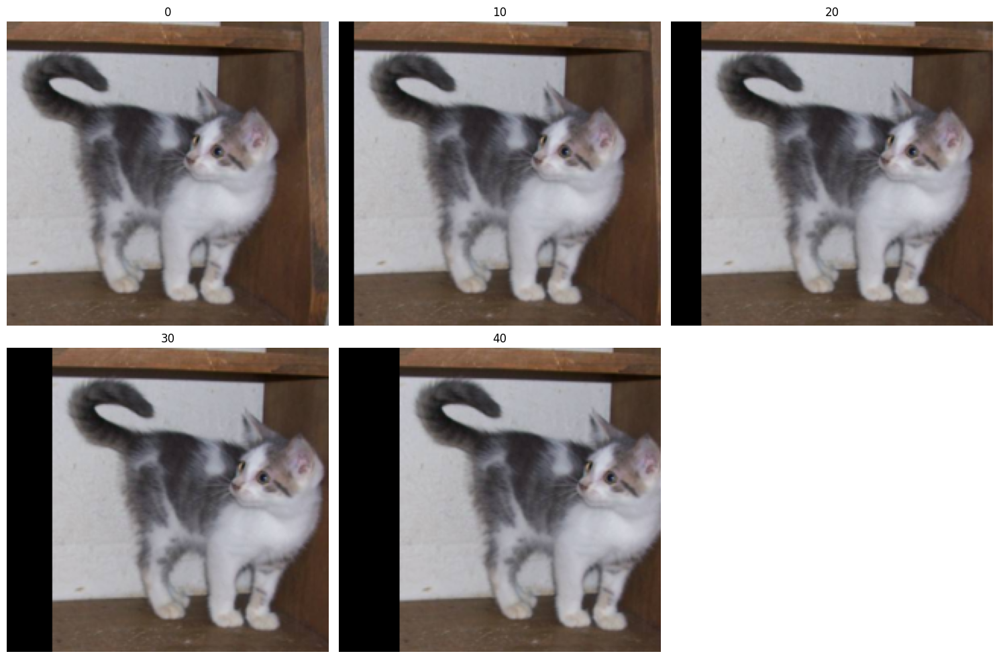

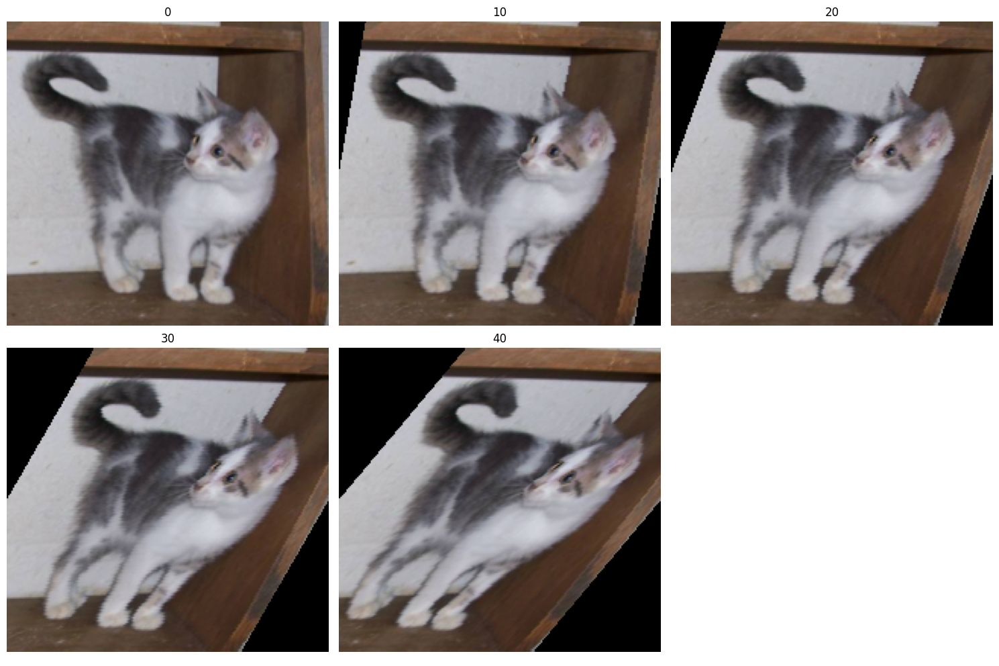

In [18]:
def apply_affine(image, angle, translate=(0, 0), scale=1.0, shear=0):
    return TF.affine(image, angle=angle, translate=translate, scale=scale, shear=shear)

# Rotation
angles = [0, 15, 30, 45, 60]
transformed_images = [apply_affine(image_resized, angle=angle) for angle in angles]
plot_transformations(transformed_images, angles)

# Scales
scales = [0.8, 1.0, 1.2, 1.5, 1.8]
transformed_images = [apply_affine(image_resized, angle=0, scale=scale) for scale in scales]
plot_transformations(transformed_images, scales)

# Translations
translations = [(0, 0), (10, 0), (20, 0), (30, 0), (40, 0)]
transformed_images = [apply_affine(image_resized, angle=0, translate=translate) for translate in translations]
plot_transformations(transformed_images, [t[0] for t in translations])

# Shear
shears = [0, 10, 20, 30, 40]
transformed_images = [apply_affine(image_resized, angle=0, shear=shear) for shear in shears]
plot_transformations(transformed_images, shears)

In [19]:
# Clear memory
del image, image_resized, transformed_images

## 2. Train a CNN

## Own Model

In [ ]:
net_config5 = {**default_net_config,
    "cv_layers": [
        {"out_channels": 64, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": False, "dropout_rate": 0},
        {"out_channels": 128, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": False, "dropout_rate": 0},
        {"out_channels": 256, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": False, "dropout_rate": 0},
        {"out_channels": 512, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": False, "dropout_rate": 0},
        {"out_channels": 512, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": False, "dropout_rate": 0},
    ],
    "fc_layers": [
        {"out_features": 4096, "batch_norm": False, "dropout_rate": 0.2},
        {"out_features": 4096, "batch_norm": False, "dropout_rate": 0.2},
    ],
    "avg_pool": False,
}

transform_config5 = {
    "hflip": True,
    "vflip": False,
    "rotation": 0,
    "crop_scale": 0,
    "brightness_jitter": 0.2,
    "contrast_jitter": 0.2,
    "saturation_jitter": 0.2,
    "hue_jitter": 0.1,
    "blur": 0,
    "affine": {
        "degrees": 20,
        "translate": (0.1, 0.1),
        "scale": (0.8, 1.2),
        "shear": (-10, 10)
    }
}

train_config5 = {**default_train_config, "learning_rate": 1e-4}

configs2 = [
    {**default_config, "label": "config5", "transform_config": transform_config5, "net_config": net_config5, "train_config": train_config5},
]
results = result_handler(configs2, device)
plot_scores(results)
predict(ConvolutionalNetwork(net_config5), "models/config5.pth", device, 5, "results/config5")


Experiment: config5
Epoch 1/80 | Train Loss: 0.6966 (acc. 51.3%) | Val Loss: 0.7056 (acc. 50.0%) | Time: 37.81s


In [ ]:
net_config1 = {**default_net_config,
    "cv_layers": [
        {"out_channels": 32, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": True, "dropout_rate": 0},
        {"out_channels": 64, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": True, "dropout_rate": 0},
        {"out_channels": 128, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": True, "dropout_rate": 0},
        {"out_channels": 256, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": True, "dropout_rate": 0},
    ],
    "fc_layers": [
        {"out_features": 256, "batch_norm": True, "dropout_rate": 0.3},
        {"out_features": 128, "batch_norm": True, "dropout_rate": 0.6},
    ]
}

net_config2 = {**default_net_config,
    "cv_layers": [
        {"out_channels": 32, "kernel_size": 5, "stride": 1, "padding": 2, "max_pool": 2, "max_pool_stride": 2, "batch_norm": True, "dropout_rate": 0},
        {"out_channels": 64, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": True, "dropout_rate": 0},
        {"out_channels": 128, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": True, "dropout_rate": 0},
        {"out_channels": 256, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": True, "dropout_rate": 0}
    ],
    "fc_layers": [
        {"out_features": 256, "batch_norm": True, "dropout_rate": 0.5},
        {"out_features": 64, "batch_norm": True, "dropout_rate": 0.6}
    ]
}

net_config3 = {**default_net_config,
    "cv_layers": [
        {"out_channels": 8, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": True, "dropout_rate": 0},
        {"out_channels": 16, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": True, "dropout_rate": 0},
        {"out_channels": 32, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": True, "dropout_rate": 0},
        {"out_channels": 64, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": True, "dropout_rate": 0},
    ],
    "fc_layers": [
        {"out_features": 512, "batch_norm": True, "dropout_rate": 0.5},
    ]
}

net_config4 = {**default_net_config,
    "cv_layers": [
        {"out_channels": 32, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": False, "dropout_rate": 0},
        {"out_channels": 64, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": False, "dropout_rate": 0},
        {"out_channels": 128, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": False, "dropout_rate": 0},
        {"out_channels": 256, "kernel_size": 3, "stride": 1, "padding": 1, "max_pool": 2, "max_pool_stride": 2, "batch_norm": False, "dropout_rate": 0},
    ],
    "fc_layers": [
        {"out_features": 256, "batch_norm": False, "dropout_rate": 0.3},
        {"out_features": 128, "batch_norm": False, "dropout_rate": 0.6},
    ]
}

train_config1 = default_train_config
train_config2 = {**default_train_config, "weight_decay": 1e-4}
train_config3 = {**default_train_config, "step_size": 7, "gamma": 0.5, "weight_decay": 1e-4}

configs1 = [
    {**default_config, "label": "config1", "net_config": net_config1, "train_config": train_config1},
    {**default_config, "label": "config2", "net_config": net_config1, "train_config": train_config2},
    {**default_config, "label": "config3", "net_config": net_config1, "train_config": train_config3},
    {**default_config, "label": "config4", "net_config": net_config2, "train_config": train_config3},
    {**default_config, "label": "config5", "net_config": net_config3, "train_config": train_config3},
    {**default_config, "label": "config6", "net_config": net_config4, "train_config": train_config1},
]
results = result_handler(configs1, device)
plot_scores(results)

predict(ConvolutionalNetwork(net_config1), "models/config1.pth", device, 5, "results/config1.csv")
predict(ConvolutionalNetwork(net_config1), "models/config2.pth", device, 5, "results/config2.csv")
predict(ConvolutionalNetwork(net_config1), "models/config3.pth", device, 5, "results/config3.csv")
predict(ConvolutionalNetwork(net_config2), "models/config4.pth", device, 5, "results/config4.csv")
predict(ConvolutionalNetwork(net_config3), "models/config5.pth", device, 5, "results/config5.csv")
predict(ConvolutionalNetwork(net_config4), "models/config6.pth", device, 5, "results/config6.csv")


Experiment: config1
Epoch 1/20 | Train Loss: 0.6916897552353996 (acc. 59.05%) | Val Loss: 0.6528360231926567 (acc. 62.333333333333336%) | Time: 34.71s
Training Time: 34.71s
Epoch 2/20 | Train Loss: 0.6394109432659452 (acc. 63.1%) | Val Loss: 0.6078494191169739 (acc. 66.66666666666667%) | Time: 35.02s
Training Time: 69.72s


## Transfer Learning

In [ ]:
num_classes = default_config["net_config"]["num_classes"]

model_alexnet = alexnet(weights=AlexNet_Weights.DEFAULT)

# Freeze all parameters/layers except last one
for name, param in model_alexnet.named_parameters():
    if("bn" not in name):
        param.requires_grad = False

# Change last layer to output 2 classes with softmax activation
model_alexnet.classifier[6] = nn.Linear(4096, num_classes)

config_alexnet = {**default_config,
    "label": "alexnet",
    "n_epochs": 10,
}

results = {}
results["alexnet"] = train_model(model_alexnet, device, config_alexnet)
plot_scores(results)
model_alexnet = AlexNet(num_classes=num_classes)
predict(model_alexnet, "models/alexnet.pth", device, num_images=2)


Experiment: alexnet


KeyboardInterrupt: 